In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import adjusted_rand_score
import umap

sns.set_theme(style="darkgrid")

Load the data from the ChampollionV0 model

In [2]:
#root_path = '/neurospin/dico/data/deep_folding/current/models/Champollion_V0_drop_rate_0/CINGULATE_left/22-30-10_0'

#root_path = '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/CINGULATE_left/2024-07-15/17-13-32_0'
#root_path = '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/CINGULATE_left/2024-07-15/17-13-32_1'
#root_path = '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/CINGULATE_left/2024-07-16/16-58-04_0'
root_path = '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/CINGULATE_left/2024-07-16/16-58-04_1'

In [ ]:
accp = pd.read_csv(f'{root_path}/accp_random_epoch80_embeddings/full_embeddings.csv', index_col=0)
accp.head()

In [ ]:
hcp = pd.read_csv(f'{root_path}/hcp_random_epoch80_embeddings/full_embeddings.csv', index_col=0)
hcp.head()

In [ ]:
ukb = pd.read_csv(f'{root_path}/ukb_random_epoch80_embeddings/full_embeddings.csv', index_col=0)
ukb.head()

In [6]:
labels_ACCP = pd.read_csv("/neurospin/dico/data/deep_folding/current/datasets/ACCpatterns/subjects_labels.csv")
labels_ACCP = labels_ACCP[['long_name','Left_PCS']]
def encoder(df, col):
    code = {'present':1,
            'absent':0}
    df[col] = df[col].map(code)
    return df
encoder(labels_ACCP,'Left_PCS') 

,long_name,Left_PCS
0,nih_chp_04701_t1,1
1,nih_chp_01534_t1,1
2,nih_chp_04623_t1,1
3,nih_chp_01503_t1,0
4,nih_chp_00404_t1,1
...,...,...
376,a0005_t1_s03,0
377,a0006_t1_s03,1
378,a0001_t1_s03,1
379,a0016_t1_s03,0


In [7]:
### To see the distribution of the values for the embeddings
"""
for i in range(15, 20):
    embeddings_UKB[f'dim{i}'].hist(bins=35)
    plt.ylabel(f'Nb of subjects')
    plt.xlabel(f'Dim {i} values')
    plt.title(f'Dim {i} density')
    plt.show()
"""

"\nfor i in range(15, 20):\n    embeddings_UKB[f'dim{i}'].hist(bins=35)\n    plt.ylabel(f'Nb of subjects')\n    plt.xlabel(f'Dim {i} values')\n    plt.title(f'Dim {i} density')\n    plt.show()\n"

Scale the data on the biggest dataset which is UKB

In [8]:
scaler = StandardScaler()
scaler.fit(ukb)

scl_bdd_hcp = scaler.transform(hcp)
scl_bdd_ukb = scaler.transform(ukb)
scl_bdd_accp = scaler.transform(accp)

scl_bdd_hcp.shape ,scl_bdd_ukb.shape, scl_bdd_accp.shape

((1114, 256), (21051, 256), (273, 256))

PCA, and selection of enough components to explain more than 99% of the variance

In [9]:
pca_components = 50

pca = PCA(n_components=pca_components)
pca.fit(scl_bdd_ukb)

PCA(n_components=50)

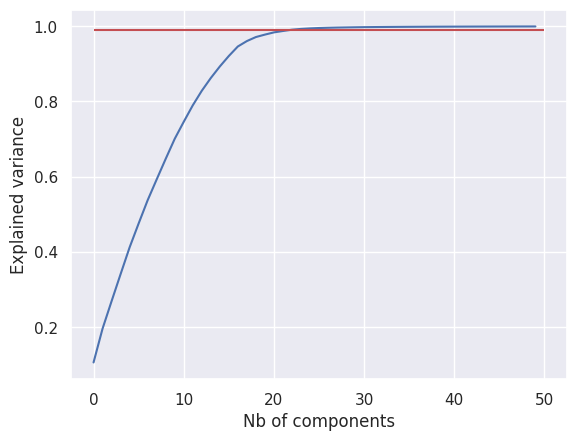

In [10]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.hlines(xmin=0, xmax=pca_components, y=0.99, colors='r')
plt.xlabel('Nb of components')
plt.ylabel('Explained variance')
plt.show()

In [11]:
np.where(np.cumsum(pca.explained_variance_ratio_) > 0.99)

(array([22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
        39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),)

In [12]:
pca_components = np.where(np.cumsum(pca.explained_variance_ratio_) > 0.99)[0][0]
pca_components

22

In [13]:
pca = PCA(n_components=pca_components)
pca.fit(scl_bdd_ukb)
pca_ukb = pca.transform(scl_bdd_ukb)
pca_hcp = pca.transform(scl_bdd_hcp)
pca_accp = pca.transform(scl_bdd_accp)

Select a dataset on which the clustering study will be done

In [14]:
data = scl_bdd_ukb

In [15]:
"""
for i in range(15, 20):
    plt.hist(scl_bdd_accp[:,i], bins=35)
    plt.ylabel(f'Nb of subjects')
    plt.xlabel(f'Dim {i} values')
    plt.title(f'Dim {i} density')
    plt.show()
"""

"\nfor i in range(15, 20):\n    plt.hist(scl_bdd_accp[:,i], bins=35)\n    plt.ylabel(f'Nb of subjects')\n    plt.xlabel(f'Dim {i} values')\n    plt.title(f'Dim {i} density')\n    plt.show()\n"

Select the models for the clustering

In [16]:
clusterers = [
        "KMeans" ,
        "AgglomerativeClustering"
    ]

nb_clusters = 10

In [17]:
def calculate_clustering_scores(data, nb_clusters=nb_clusters):
    results = {}

    for name in clusterers:
        silhouette_scores = []
        calinski_harabasz_scores = []
        davies_bouldin_scores = []
        for i in range(2,nb_clusters+1):
            if name=="KMeans":
                model = KMeans(n_clusters=i, random_state=i, init="k-means++")
            if name=="AgglomerativeClustering":
                model = AgglomerativeClustering(n_clusters=i,)# metric="euclidean", linkage="ward")
            
            labels = model.fit_predict(data)
        
            sil_score = silhouette_score(data, labels)
            cal_score = calinski_harabasz_score(data, labels)
            dav_score = davies_bouldin_score(data, labels)
                
            silhouette_scores.append(sil_score)
            calinski_harabasz_scores.append(cal_score)
            davies_bouldin_scores.append(dav_score)

        results[name] = {"sil_score":silhouette_scores,
                         "cal_score":calinski_harabasz_scores,
                         "dav_score":davies_bouldin_scores}
        
    return results

In [18]:
results = calculate_clustering_scores(data,nb_clusters)

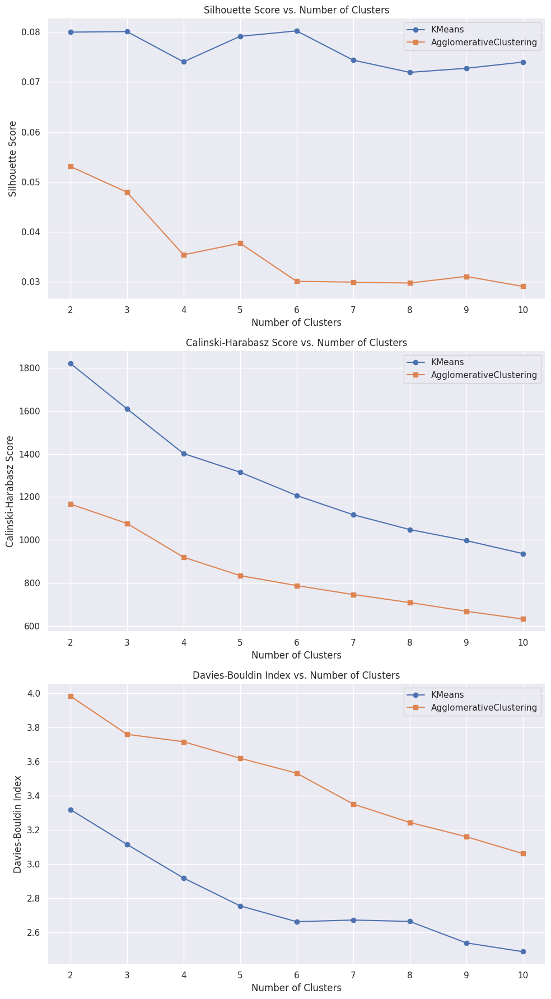

In [19]:
# Number of clusters
n_clusters_range = range(2,nb_clusters+1)

# Extracting the scores
kmeans_sil = results['KMeans']['sil_score']
kmeans_cal = results['KMeans']['cal_score']
kmeans_dav = results['KMeans']['dav_score']

agg_sil = results['AgglomerativeClustering']['sil_score']
agg_cal = results['AgglomerativeClustering']['cal_score']
agg_dav = results['AgglomerativeClustering']['dav_score']

# Plotting
fig, axes = plt.subplots(3, 1, figsize=(10, 18))

# Silhouette Score
axes[0].plot(n_clusters_range, kmeans_sil, label='KMeans', marker='o')
axes[0].plot(n_clusters_range, agg_sil, label='AgglomerativeClustering', marker='s')
axes[0].set_xlabel('Number of Clusters')
axes[0].set_ylabel('Silhouette Score')
axes[0].set_title('Silhouette Score vs. Number of Clusters')
axes[0].legend()
axes[0].set_xticks(n_clusters_range)

# Calinski-Harabasz Score
axes[1].plot(n_clusters_range, kmeans_cal, label='KMeans', marker='o')
axes[1].plot(n_clusters_range, agg_cal, label='AgglomerativeClustering', marker='s')
axes[1].set_xlabel('Number of Clusters')
axes[1].set_ylabel('Calinski-Harabasz Score')
axes[1].set_title('Calinski-Harabasz Score vs. Number of Clusters')
axes[1].legend()
axes[1].set_xticks(n_clusters_range)

# Davies-Bouldin Index
axes[2].plot(n_clusters_range, kmeans_dav, label='KMeans', marker='o')
axes[2].plot(n_clusters_range, agg_dav, label='AgglomerativeClustering', marker='s')
axes[2].set_xlabel('Number of Clusters')
axes[2].set_ylabel('Davies-Bouldin Index')
axes[2].set_title('Davies-Bouldin Index vs. Number of Clusters')
axes[2].legend()
axes[2].set_xticks(n_clusters_range)

plt.tight_layout()
plt.show()

Use a dimension reduction method so as to visualize the data in 2D

In [20]:
reducer = umap.UMAP()
reducer.fit(scl_bdd_ukb)

/neurospin/dico/adufournet/Runs/01_Heritability_Right_PCS_HCP/Program/2023_jlaval_STSbabies/venv/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


UMAP(tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [21]:
bdd_2D_HCP = reducer.transform(scl_bdd_hcp) #reducer.transform(scl_bdd_hcp)
bdd_2D_UKB = reducer.transform(scl_bdd_ukb) #reducer.transform(scl_bdd_ukb)
bdd_2D_ACCP = reducer.transform(scl_bdd_accp) #reducer.transform(scl_bdd_accp)

bdd_2D_HCP = pd.DataFrame(bdd_2D_HCP, columns=['Dim 1', 'Dim 2'])
bdd_2D_UKB = pd.DataFrame(bdd_2D_UKB, columns=['Dim 1', 'Dim 2'])
bdd_2D_ACCP = pd.DataFrame(bdd_2D_ACCP, columns=['Dim 1', 'Dim 2'])

bdd_2D_HCP['Dataset'] = 'hcp'
bdd_2D_UKB['Dataset'] = 'UkBioBank'
bdd_2D_ACCP['Dataset'] = 'ACCpatterns'

bdd_2D_HCP['ID'] = hcp.index
bdd_2D_UKB['ID'] = ukb.index
bdd_2D_UKB['ID'] = bdd_2D_UKB["ID"].apply(lambda x: x[4:])
bdd_2D_UKB['ID'] = bdd_2D_UKB["ID"].astype(int)
bdd_2D_ACCP['ID'] = accp.index

pred_HCP = pd.read_csv('/neurospin/dico/adufournet/Runs/02_Heritability_Left_PCS_HCP/Heritability/data/HCP_binary_pred_left_PCS.csv')
pred_UKB = pd.read_csv('/neurospin/dico/adufournet/Runs/02_Heritability_Left_PCS_HCP/Heritability/data/UKB_binary_pred.csv')


bdd_2D_HCP = pd.merge(left=bdd_2D_HCP,right=pred_HCP, how='inner', left_on='ID', right_on='IID')
bdd_2D_UKB = pd.merge(left=bdd_2D_UKB,right=pred_UKB, how='inner', left_on='ID', right_on='IID')
bdd_2D_ACCP = pd.merge(left=bdd_2D_ACCP, right=labels_ACCP, left_on='ID', right_on='long_name')

bdd_2D_HCP['Pred'] = bdd_2D_HCP['Pred'].astype(str)
bdd_2D_UKB['Binary_Pred'] = bdd_2D_UKB['Binary_Pred'].astype(str)
bdd_2D_ACCP['Left_PCS'] = bdd_2D_ACCP['Left_PCS'].astype(str)

In [22]:
def visualize_clusters(data, classes, title):
    
    fig = px.scatter(
        data, x='Dim 1', y='Dim 2', 
        color=classes,
        title=title,
        labels={'0': 'dim 1', '1': 'dim 2'},
        hover_data= ['Dataset', 'ID'],
        opacity=0.5,
        width=800, height=800
)
    fig.show()

<Axes: xlabel='Dim 1', ylabel='Dim 2'>

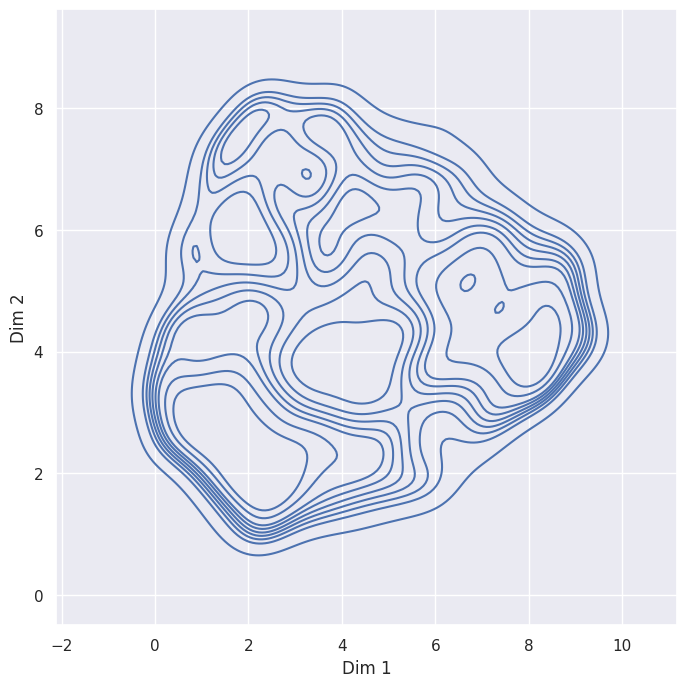

In [23]:
# Set up the figure
f, ax = plt.subplots(figsize=(8, 8))
#ax.set_aspect("equal")

# Draw a contour plot to represent each bivariate density
sns.kdeplot(
    data=bdd_2D_UKB,
    x="Dim 1",
    y="Dim 2",
    thresh=.1,
)

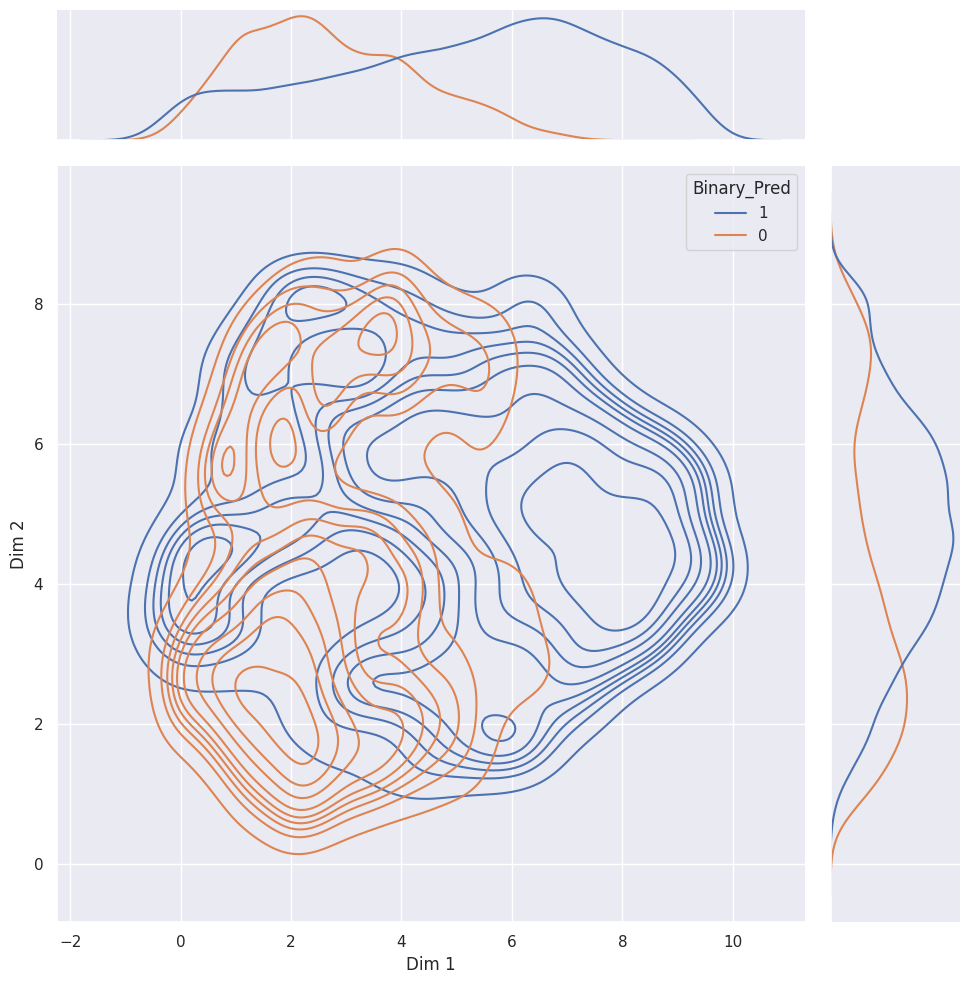

In [24]:
sns.jointplot(
    data=bdd_2D_UKB,
    x="Dim 1", y="Dim 2", hue="Binary_Pred",
    kind="kde",
    height=10, 
    ratio=5
)

In [25]:
visualize_clusters(bdd_2D_UKB, 'Binary_Pred', 'UKB left PCS prediction')

#### Let's see the accuracy of the automatic clustering regarding to the prediction of having a PCS as the ground truth.

In [50]:
def plot_matching_labels(True_labels, auto_labels):
    conf_matrix = confusion_matrix(True_labels, auto_labels)
    conf_matrix = conf_matrix[:len(np.unique(True_labels)), :len(np.unique(auto_labels))]

    # Convert the confusion matrix to a DataFrame for better readability
    conf_df = pd.DataFrame(conf_matrix, index=[f'{i}' for i in np.unique(True_labels)],
                        columns=[f'{i}' for i in np.unique(auto_labels)])

    # Calculate percentages
    conf_df_percent = conf_df.div(conf_df.sum(axis=0), axis=1) * 100

    plt.figure(figsize=(12, 4))
    sns.heatmap(conf_df_percent, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Percentage'})
    plt.title('Percentage of Subjects Automatically Classified Matching the Different Classes')
    plt.xlabel('Automatic Labels')
    plt.ylabel('Ground truth')
    plt.show()

    return conf_df_percent

On UKB:

In [40]:
agglo_model = AgglomerativeClustering(4)
agglo_labels = agglo_model.fit_predict(data)

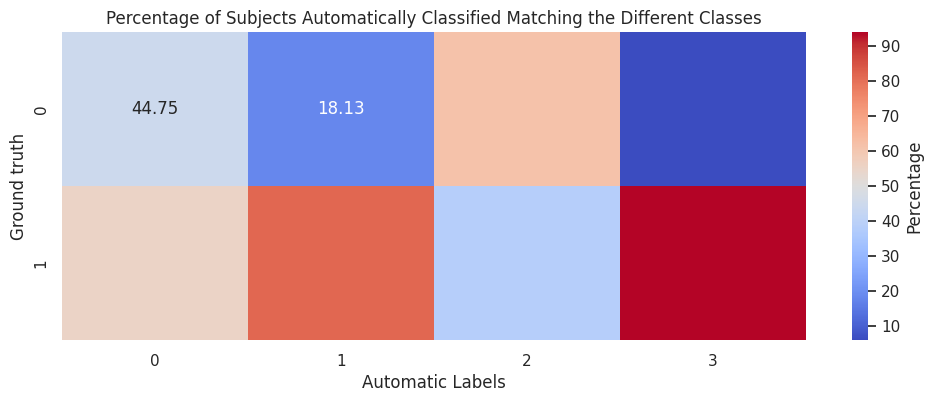

In [51]:
left_pcs_labels = bdd_2D_UKB['Binary_Pred'].astype(int).to_numpy()

a=plot_matching_labels(left_pcs_labels, agglo_labels)

In [29]:
visualize_clusters(bdd_2D_UKB, agglo_labels.astype('str'), 'UKB left Agglomerative clustering')

In [30]:
bdd_2D_UKB['Auto_clust'] = agglo_labels.astype('str')

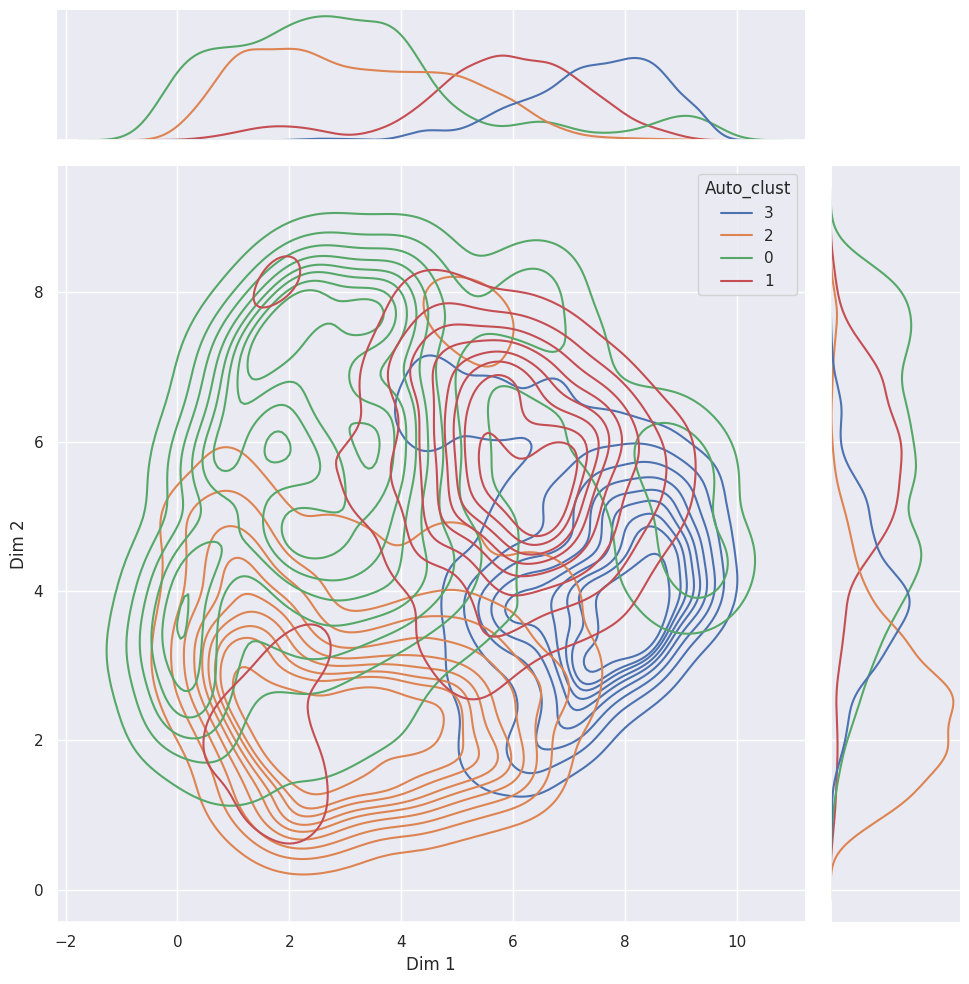

In [31]:
sns.jointplot(
    data=bdd_2D_UKB,
    x="Dim 1", y="Dim 2", hue="Auto_clust",
    kind="kde",
    height=10, 
    ratio=5
)

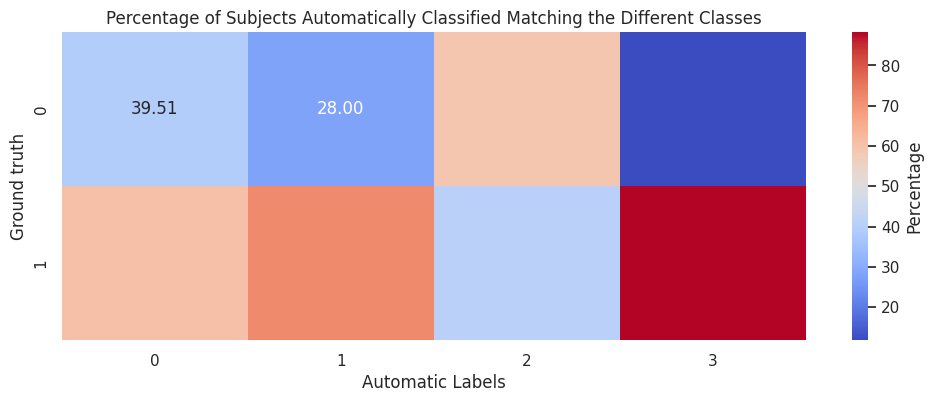

In [32]:
automatic_labels = agglo_model.fit_predict(pca_accp)
a=plot_matching_labels(bdd_2D_ACCP['Left_PCS'].astype(int).to_numpy() , automatic_labels)

[[ 949 2046   48 1210 1196 2620    6]
 [1763 1638 2954 1564 1563 1110 2384]
 [   0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0]]


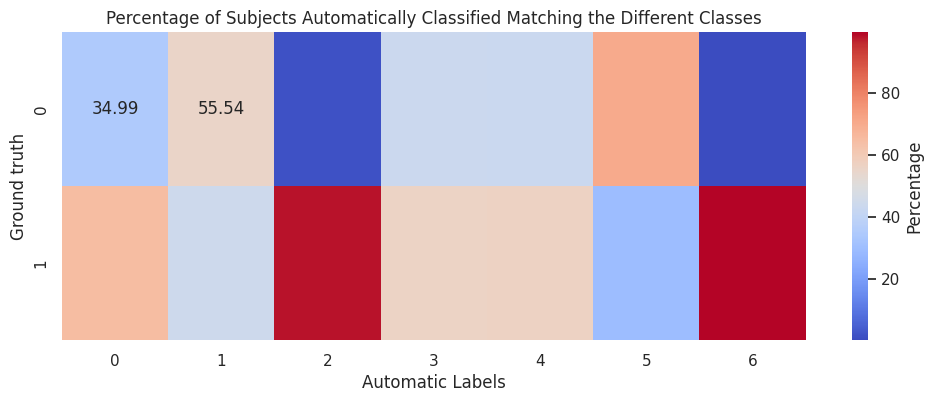

In [37]:
kmeans_model = KMeans(n_clusters=7, init='k-means++', max_iter=500, n_init=1)
kmeans_labels = kmeans_model.fit_predict(data)

a=plot_matching_labels(bdd_2D_UKB['Binary_Pred'].astype(int).to_numpy() , kmeans_labels)

In [34]:
visualize_clusters(bdd_2D_UKB, kmeans_labels.astype('str'), 'UKB left KMEANS clustering')

[[16 41  1 18 10 19  1]
 [28 32 24 31 18 11 23]
 [ 0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0]]


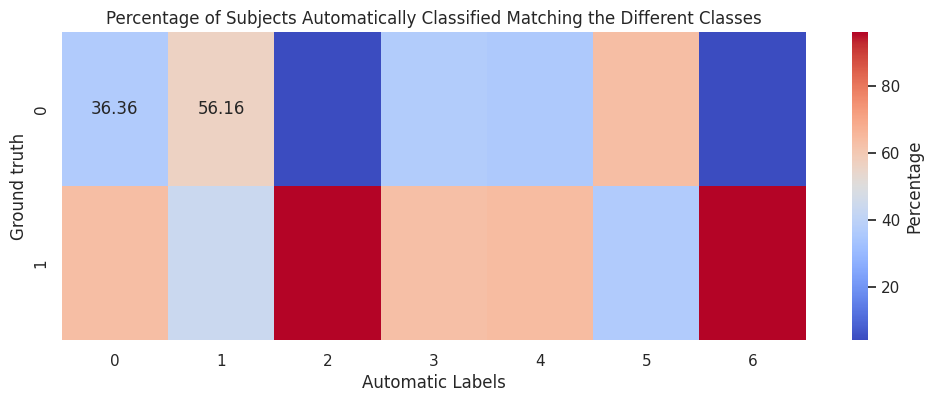

In [38]:
automatic_labels = kmeans_model.predict(scl_bdd_accp)

a=plot_matching_labels(bdd_2D_ACCP['Left_PCS'].astype(int).to_numpy() , automatic_labels)

Percentage of matching labels for the kmeans and agglomerative methods:

In [ ]:
adjusted_rand_score(agglo_labels, kmeans_labels)

0.26369261739774047

#### Let's see the stability of the KMEANS method on one embedding

For 2 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 2 clusters: 0.7034


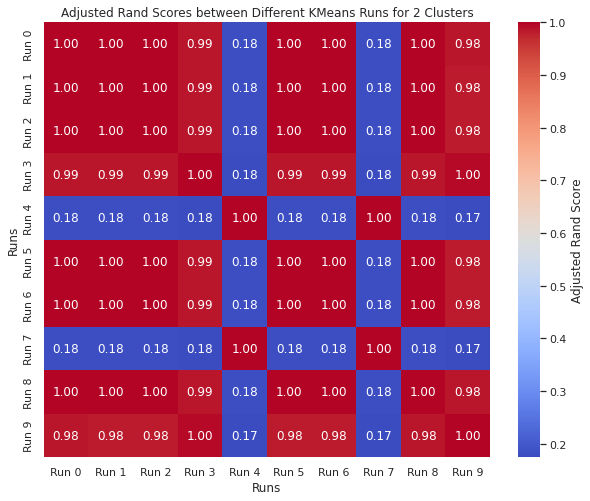

For 3 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 3 clusters: 0.9654


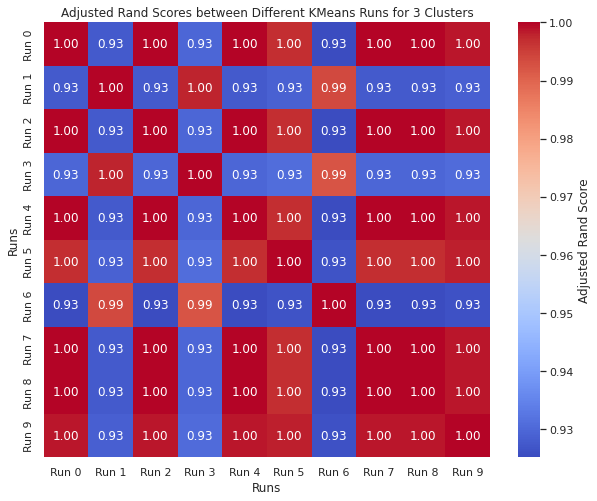

For 4 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 4 clusters: 0.9390


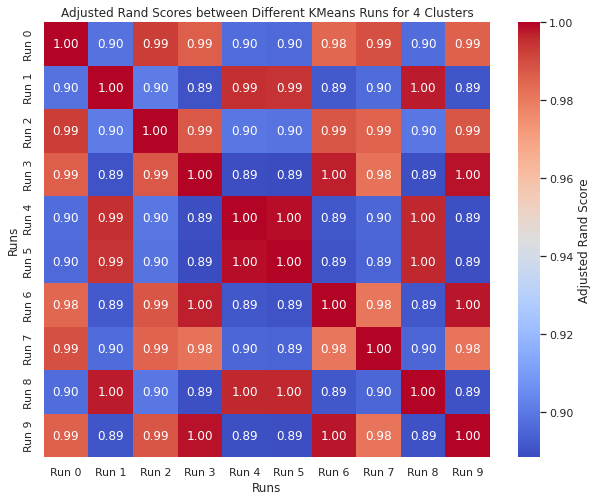

For 5 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 5 clusters: 0.7320


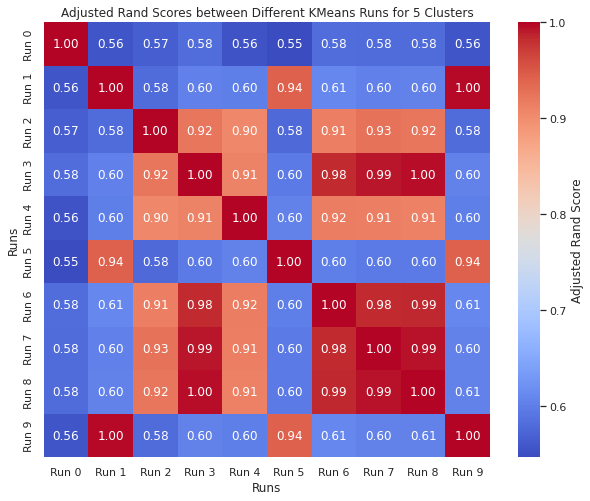

For 6 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 6 clusters: 0.5942


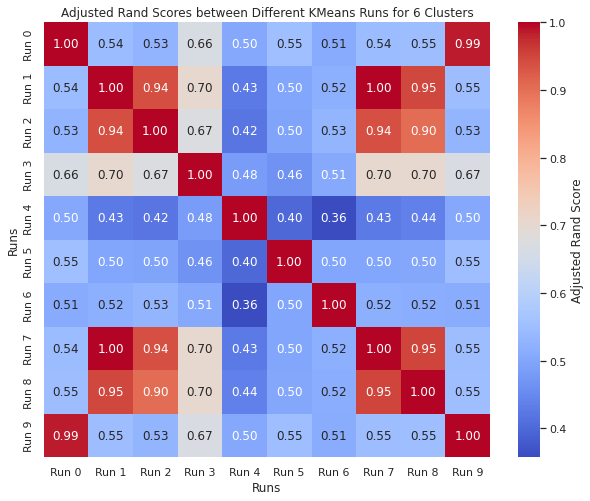

For 7 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 7 clusters: 0.5625


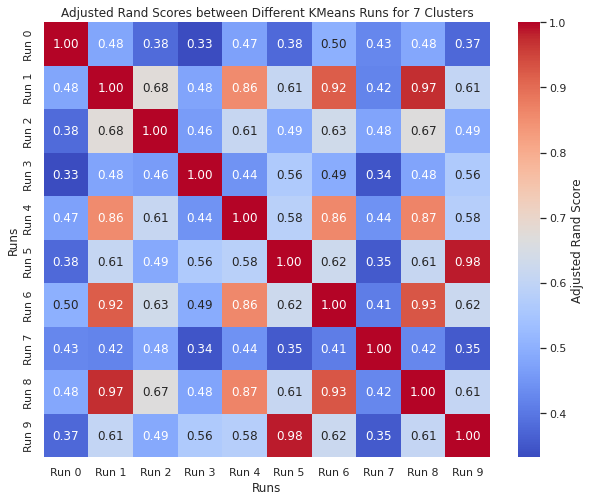

For 8 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 8 clusters: 0.5344


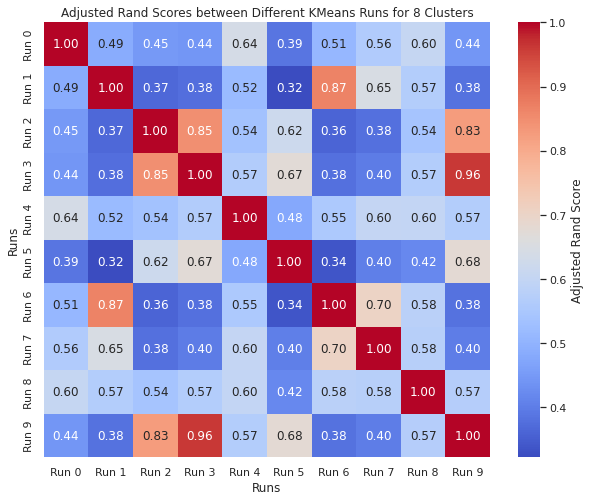

For 9 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 9 clusters: 0.5748


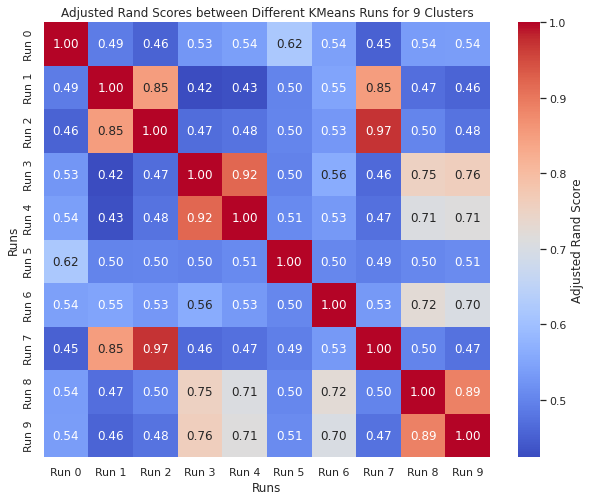

For 10 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 10 clusters: 0.5769


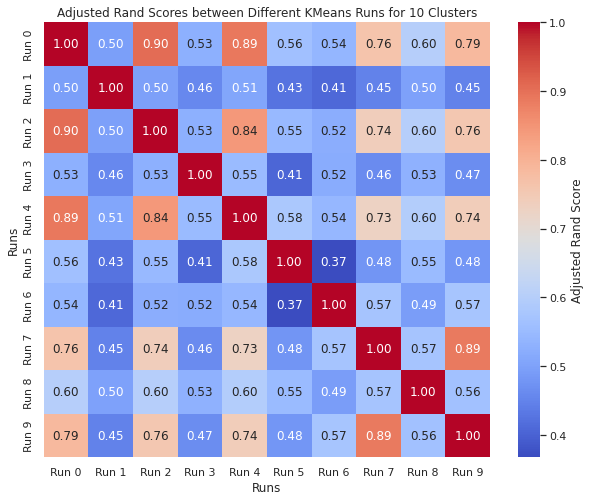

In [ ]:
for nb_cl in range(2, 11):
    print(f"For {nb_cl} clusters, the adjusted rand scores for 10 KMEANS models give:")
    
    # Define the KMeans model
    kmeans_model = KMeans(n_clusters=nb_cl, init='k-means++', max_iter=500, n_init=1)

    # Store the labels from each run
    labels_list = []

    # Perform 10 runs with different initializations
    for i in range(10):
        kmeans_model.fit(data)
        labels_list.append(kmeans_model.labels_)

    # Calculate adjusted Rand scores for each pair of runs
    rand_scores = np.zeros((10, 10))

    for i in range(10):
        for j in range(i, 10):
            score = adjusted_rand_score(labels_list[i], labels_list[j])
            rand_scores[i, j] = score
            rand_scores[j, i] = score

    # Convert to DataFrame for better readability
    rand_scores_df = pd.DataFrame(rand_scores, columns=[f'Run {i}' for i in range(10)],
                                  index=[f'Run {i}' for i in range(10)])

    # Extract the upper diagonal part of the matrix
    upper_diag_scores = rand_scores[np.triu_indices(10, k=1)]

    # Calculate the mean of the upper diagonal part
    mean_upper_diag_score = np.mean(upper_diag_scores)
    print(f"Mean Adjusted Rand Score for {nb_cl} clusters: {mean_upper_diag_score:.4f}")

    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(rand_scores_df, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Adjusted Rand Score'})
    plt.title(f'Adjusted Rand Scores between Different KMeans Runs for {nb_cl} Clusters')
    plt.xlabel('Runs')
    plt.ylabel('Runs')
    plt.show()

#### Let's see the stability of the agglomerative clustering on different embeddings

In [ ]:
rootpath_dic = {
    "root_path0" : '/neurospin/dico/data/deep_folding/current/models/Champollion_V0_drop_rate_0/CINGULATE_left/22-30-10_0',
    "root_path1" : '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/CINGULATE_left/2024-07-15/17-13-32_0',
    "root_path2" : '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/CINGULATE_left/2024-07-15/17-13-32_1',
    "root_path3" : '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/CINGULATE_left/2024-07-16/16-58-04_0',
    "root_path4" : '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/CINGULATE_left/2024-07-16/16-58-04_1',
    }

In [ ]:
embeddings = {}

for i in tqdm(range(5)):
    
    root_path = rootpath_dic[f'root_path{i}']
    embeddings[f'ukb_{i}'] = pd.read_csv(f'{root_path}/ukb_random_epoch80_embeddings/full_embeddings.csv', index_col=0)
    
    scaler = StandardScaler()

    scaler.fit(embeddings[f'ukb_{i}'])
    embeddings[f'scl_ukb_{i}'] = scaler.transform(embeddings[f'ukb_{i}'])
    
    pca_components = 50
    pca = PCA(n_components=pca_components)

    pca.fit(embeddings[f'scl_ukb_{i}'])
    pca_components = np.where(np.cumsum(pca.explained_variance_ratio_) > 0.99)[0][0]
    pca = PCA(n_components=pca_components)
    pca.fit(embeddings[f'scl_ukb_{i}'])
    embeddings[f'pca_ukb_{i}'] = pca.transform(embeddings[f'scl_ukb_{i}'])

100%|██████████| 5/5 [00:15<00:00,  3.07s/it]


For 2 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:02<00:00,  1.93it/s]


Mean Adjusted Rand Score for 2 clusters: 0.4692


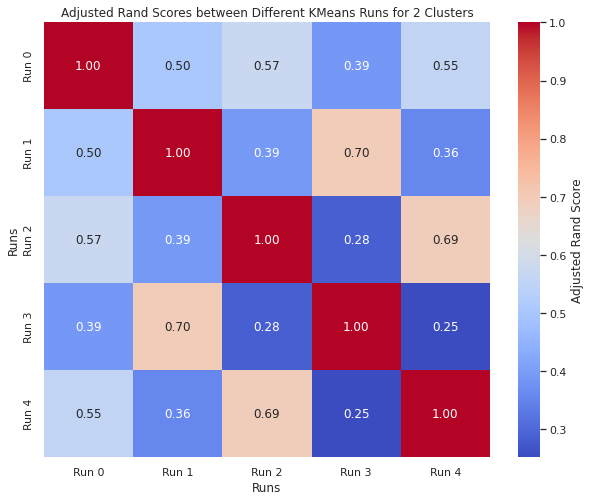

For 3 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:03<00:00,  1.47it/s]


Mean Adjusted Rand Score for 3 clusters: 0.4227


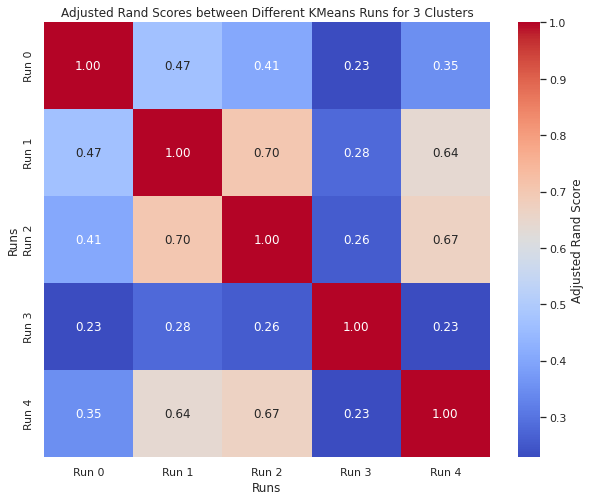

For 4 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:03<00:00,  1.28it/s]


Mean Adjusted Rand Score for 4 clusters: 0.3947


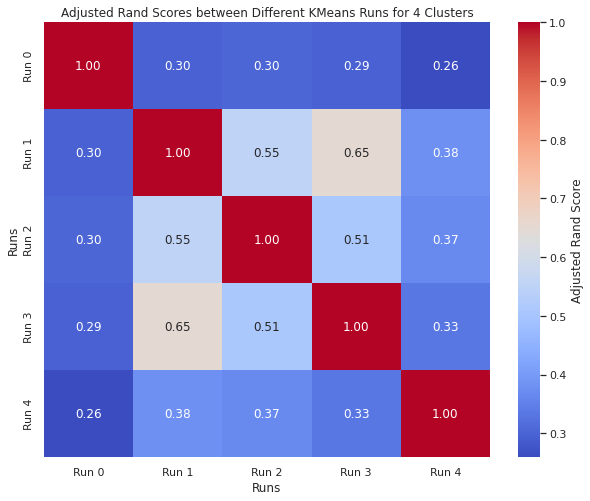

For 5 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:04<00:00,  1.04it/s]


Mean Adjusted Rand Score for 5 clusters: 0.3497


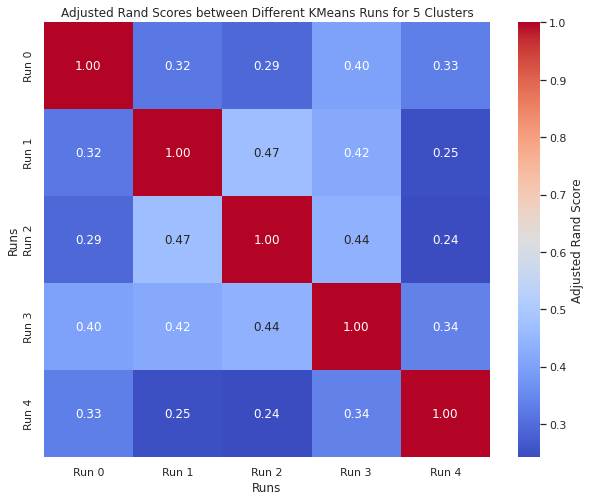

For 6 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:06<00:00,  1.26s/it]


Mean Adjusted Rand Score for 6 clusters: 0.3428


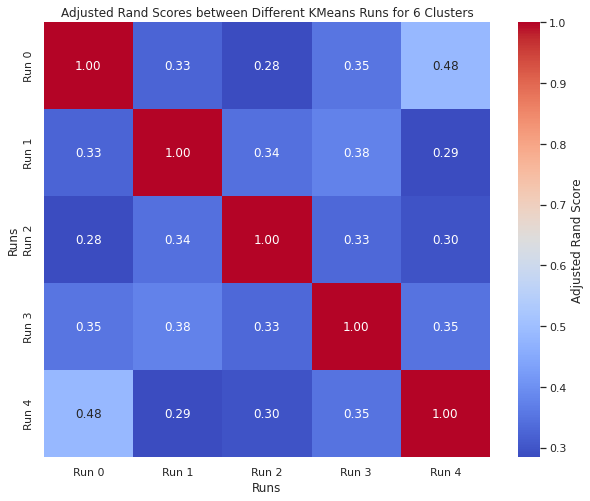

In [ ]:
nb_ebdd = len(rootpath_dic)

for nb_cl in range(2, 7):
    print(f"For {nb_cl} clusters, the adjusted rand scores for 5 embeddings give:")
    
    # Define the KMeans model
    #agglo_model = AgglomerativeClustering(n_clusters=nb_cl)
    agglo_model = KMeans(n_clusters=nb_cl, init='k-means++', max_iter=500, n_init=1)

    # Store the labels from each run
    labels_list = []

    # Perform 5 runs with different embeddings
    for mbb_i in tqdm(range(nb_ebdd)):

        data = embeddings[f'scl_ukb_{mbb_i}']
        #data = embeddings[f'pca_ukb_{mbb_i}']
        agglo_model.fit(data)
        labels_list.append(agglo_model.labels_)

    # Calculate adjusted Rand scores for each pair of runs
    rand_scores = np.zeros((nb_ebdd, nb_ebdd))

    for i in range(nb_ebdd):
        for j in range(i, nb_ebdd):
            score = adjusted_rand_score(labels_list[i], labels_list[j])
            rand_scores[i, j] = score
            rand_scores[j, i] = score

    # Convert to DataFrame for better readability
    rand_scores_df = pd.DataFrame(rand_scores, columns=[f'Run {i}' for i in range(nb_ebdd)],
                                  index=[f'Run {i}' for i in range(nb_ebdd)])

    # Extract the upper diagonal part of the matrix
    upper_diag_scores = rand_scores[np.triu_indices(nb_ebdd, k=1)]

    # Calculate the mean of the upper diagonal part
    mean_upper_diag_score = np.mean(upper_diag_scores)
    print(f"Mean Adjusted Rand Score for {nb_cl} clusters: {mean_upper_diag_score:.4f}")

    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(rand_scores_df, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Adjusted Rand Score'})
    plt.title(f'Adjusted Rand Scores between Different KMeans Runs for {nb_cl} Clusters')
    plt.xlabel('Runs')
    plt.ylabel('Runs')
    plt.show()